## Load Data



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# %cd /content/drive/My Drive/punyabella
%cd /content/drive/My Drive/Kuliah/E-Tourism

/content/drive/My Drive/Kuliah/E-Tourism


In [ ]:
!pip install sastrawi
!pip install swifter

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 209.7/209.7 kB 10.2 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 830.9/830.9 kB 43.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 77.4 MB/s eta 0:00:00
  Created wheel for swifter: filename=swifter-1.3.4-py3-none-any.whl size=16299 sha256=50d31d1cc0c070f50635c9b931b959dbbb3f6a4b9d0f2a43c79276eeaad6176a
  Stored in directory: /root/.cache/pip/wheels/6c/bd/3e/2d6afc9bc36c9975f8e4215a270bbac6580c4361ebd6bb2323
Successfully built swifter


In [ ]:
#import library
import pandas as pd
import numpy as np
from string import punctuation
import re
import nltk
from nltk.tokenize import word_tokenize
# nltk.download('punkt')

In [ ]:
#load data
# df = pd.read_excel("Toroan_tanpa netral.xlsx", encoding='cp1252', error_bad_lines=False)
df = pd.read_excel("Data.xlsx")
df

,Nama,Ulasan
0,Antonina Suryantari,Tempatnya bagus tetapi agak kotor. Ada limbah ...
1,izdiharuddin muhammad,"Pemandangan yg indah, adem pula suasanyanya me..."
2,Novakusuma Bangsa,tempat wisata yg keren dan recomended bgt buat...
3,Hendra Susanto,"Mantap viewnya bagus banget, terlihat masih as..."
4,Gabriel Pramana,Pemandangannya bagus tempatnya nyaman. Tetapi ...
...,...,...
871,Fhiina ashraf,Beautifulll.....
872,Basri Hailullah,Desa ku
873,Agus Sudrajat,Magnificent...
874,SYAIFUL BAHRI,Yoi


In [ ]:
df.shape

(876, 2)

In [ ]:
df.isnull().sum()

Nama      0
Ulasan    0
dtype: int64

## Preprocessing

### 1. Symbol & Punctuation Removal

In [ ]:
#proses menghilangkan angka
def remove_numbers (text):
  return re.sub(r"\d+", "", text)
df['Ulasan'] = df['Ulasan'].apply(remove_numbers)
df['Ulasan']

0      Tempatnya bagus tetapi agak kotor. Ada limbah ...
1      Pemandangan yg indah, adem pula suasanyanya me...
2      tempat wisata yg keren dan recomended bgt buat...
3      Mantap viewnya bagus banget, terlihat masih as...
4      Pemandangannya bagus tempatnya nyaman. Tetapi ...
                             ...                        
871                                     Beautifulll.....
872                                              Desa ku
873                                       Magnificent...
874                                                  Yoi
875                                        Muaannnntaaap
Name: Ulasan, Length: 876, dtype: object

In [ ]:
#proses menghilangkan simbol dan emoji
def remove_text_special (text):
  text = text.replace('\\t',"").replace('\\n',"").replace('\\u',"").replace('\\',"")
  text = text.encode('ascii', 'replace').decode('ascii')
  return text.replace("http://"," ").replace("https://", " ")
df['Ulasan'] = df['Ulasan'].apply(remove_text_special)
print(df['Ulasan'])

0      Tempatnya bagus tetapi agak kotor. Ada limbah ...
1      Pemandangan yg indah, adem pula suasanyanya me...
2      tempat wisata yg keren dan recomended bgt buat...
3      Mantap viewnya bagus banget, terlihat masih as...
4      Pemandangannya bagus tempatnya nyaman. Tetapi ...
                             ...                        
871                                     Beautifulll.....
872                                              Desa ku
873                                       Magnificent...
874                                                  Yoi
875                                        Muaannnntaaap
Name: Ulasan, Length: 876, dtype: object


In [ ]:
#menghilangkan tanda baca
def remove_tanda_baca(text):
  text = ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)"," ",text).split())
  return text

df['Ulasan'] = df['Ulasan'].apply(remove_tanda_baca)
df.head(20)

,Nama,Ulasan
0,Antonina Suryantari,Tempatnya bagus tetapi agak kotor Ada limbah t...
1,izdiharuddin muhammad,Pemandangan yg indah adem pula suasanyanya mes...
2,Novakusuma Bangsa,tempat wisata yg keren dan recomended bgt buat...
3,Hendra Susanto,Mantap viewnya bagus banget terlihat masih asr...
4,Gabriel Pramana,Pemandangannya bagus tempatnya nyaman Tetapi s...
5,Nur Azizah,Tiket masuk rb orang anak free Batu karang nya...
6,Adi Purna,november Unik jg air terjun di pinggir laut Sa...
7,muhammad ansani,Tempatnya nyaman lesehan makanannya lumayan ba...
8,tri haryadi,Pemandangan di sini bagus karena memadukan air...
9,S Nowo El Mahdy,Dulu lumayan sering ke sini Salah satu destina...


### 2. Case Folding

In [ ]:
#proses casefolding
def casefolding(Comment):
  Comment = Comment.lower()
  Comment = Comment.strip(" ")
  return Comment
df['Ulasan'] = df['Ulasan'].apply(casefolding)
df['Ulasan']

0      tempatnya bagus tetapi agak kotor ada limbah t...
1      pemandangan yg indah adem pula suasanyanya mes...
2      tempat wisata yg keren dan recomended bgt buat...
3      mantap viewnya bagus banget terlihat masih asr...
4      pemandangannya bagus tempatnya nyaman tetapi s...
                             ...                        
871                                          beautifulll
872                                              desa ku
873                                          magnificent
874                                                  yoi
875                                        muaannnntaaap
Name: Ulasan, Length: 876, dtype: object

### 3. Tokenizing

In [ ]:
#proses tokenisasi
from nltk.tokenize import TweetTokenizer
def word_tokenize(text):
  tokenizer = TweetTokenizer(preserve_case=False, strip_handles=True, reduce_len=True)
  return tokenizer.tokenize(text)

df['review_token'] = df['Ulasan'].apply(word_tokenize)
df['review_token']

0      [tempatnya, bagus, tetapi, agak, kotor, ada, l...
1      [pemandangan, yg, indah, adem, pula, suasanyan...
2      [tempat, wisata, yg, keren, dan, recomended, b...
3      [mantap, viewnya, bagus, banget, terlihat, mas...
4      [pemandangannya, bagus, tempatnya, nyaman, tet...
                             ...                        
871                                        [beautifulll]
872                                           [desa, ku]
873                                        [magnificent]
874                                                [yoi]
875                                       [muaannntaaap]
Name: review_token, Length: 876, dtype: object

### 4. Word Normalization

In [ ]:
#Normalisasi kata tidak baku
normalize = pd.read_excel("/content/drive/My Drive/Kuliah/E-Tourism/Normalization Data.xlsx")

normalize_word_dict = {}

for index, row in normalize.iterrows():
  if row[0] not in normalize_word_dict:
    normalize_word_dict[row[0]] = row[1]

def normalized_term(comment):
  return [normalize_word_dict[term] if term in normalize_word_dict else term for term in comment]

df['comment_normalize'] = df['review_token'].apply(normalized_term)
df['comment_normalize'].head(20)

0     [tempatnya, bagus, tetapi, agak, kotor, ada, l...
1     [pemandangan, yang, indah, adem, pula, suasany...
2     [tempat, wisata, yang, keren, dan, rekomendasi...
3     [mantap, viewnya, bagus, banget, terlihat, mas...
4     [pemandangannya, bagus, tempatnya, nyaman, tet...
5     [tiket, masuk, rb, orang, anak, gratis, batu, ...
6     [november, unik, juga, air, terjun, di, pinggi...
7     [tempatnya, nyaman, lesehan, makanannya, lumay...
8     [pemandangan, di, sini, bagus, karena, memaduk...
9     [dulu, lumayan, sering, ke, sini, salah, satu,...
10    [wisata, air, terjun, toroan, airnya, sungai, ...
11    [patut, dicoba, masih, sangat, alami, sebelum,...
12    [tempatnya, bagus, selain, air, terjun, diatas...
13    [kondisi, setelah, hujan, airnya, jadi, kecokl...
14    [pulau, madura, ternyata, mempunyai, obyek, wi...
15    [sengkok, oreng, ketapang, cong, dus, nodusih,...
16    [air, terjun, toroan, ini, bagus, sekali, air,...
17    [dari, sumenep, ke, air, terjun, yang, ber

### 5. Stopwords Removal

In [ ]:
#Stopword Removal
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
txt_stopwords = stopwords.words('indonesian')

def stopwords_removal(filtering) :
  filtering = [word for word in filtering if word not in txt_stopwords]
  return filtering

df['stopwords_removal'] = df['comment_normalize'].apply(stopwords_removal)
df['stopwords_removal'].head(20)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


0     [tempatnya, bagus, kotor, limbah, tebu, dibuan...
1     [pemandangan, indah, adem, suasanyanya, pinggi...
2     [wisata, keren, rekomendasi, banget, dikunjung...
3     [mantap, viewnya, bagus, banget, asri, air, te...
4     [pemandangannya, bagus, tempatnya, nyaman, say...
5     [tiket, masuk, rb, orang, anak, gratis, batu, ...
6     [november, unik, air, terjun, pinggir, laut, s...
7     [tempatnya, nyaman, lesehan, makanannya, lumay...
8     [pemandangan, bagus, memadukan, air, terjun, l...
9     [lumayan, salah, destinasi, favorit, hunting, ...
10    [wisata, air, terjun, toroan, airnya, sungai, ...
11    [patut, dicoba, alami, masuk, infokan, petugas...
12    [tempatnya, bagus, air, terjun, diatasnya, res...
13                 [kondisi, hujan, airnya, kecoklatan]
14    [pulau, madura, obyek, wisata, air, terjun, pi...
15    [sengkok, oreng, ketapang, cong, dus, nodusih,...
16    [air, terjun, toroan, bagus, air, terjun, jatu...
17    [sumenep, air, terjun, utara, butuh, perju

In [ ]:
#stopword removal 2
data_stopwords = pd.read_excel("/content/drive/My Drive/Kuliah/E-Tourism/list_stopwords.xlsx")
print(data_stopwords)


def stopwords_removal2(filter) :
  filter = [word for word in filter if word not in data_stopwords]
  return filter

df['stopwords_removal_final'] = df['stopwords_removal'].apply(stopwords_removal2)
df['stopwords_removal_final'].head(20)

Empty DataFrame
Columns: [kah, samping, kiri, maju, mundur, orang kedua, youtube, nya, non, gaada, hehe, heheee, haha, bf, dll, un, safa, ida, idak, aja, kk, wkwkk, gimana, lihat, duel, boong, ya, coba, anjing, pilihan, sandi, seklai, anggi, tetima, ubtik, tai, t, f, a, v, lt, cq, fd, e, h, da, diba, ax, babu, tombol, kantuk, kntl, sherina, ter, eh, kitaudah, cari, daan, ketemu, sdang, luring, pas, luring.1, bilang, log, in, kembaliterimah, nge, lo, dakwahlbh, klan, detik, tolol, kaka, kakk, kakak, silah, mbaaak, mbak, kn, fasid, solo, loh, bagusbagus, an, nan, babi, negara, m, t.1, o, p, ii, nyacuma, putarpilihdengerinklo, sia, cv, katai, luring.2, log.1, ...]
Index: []

[0 rows x 357 columns]


0     [tempatnya, bagus, kotor, limbah, tebu, dibuan...
1     [pemandangan, indah, adem, suasanyanya, pinggi...
2     [wisata, keren, rekomendasi, banget, dikunjung...
3     [mantap, viewnya, bagus, banget, asri, air, te...
4     [pemandangannya, bagus, tempatnya, nyaman, say...
5     [tiket, masuk, rb, gratis, batu, karang, air, ...
6     [november, unik, air, terjun, pinggir, laut, s...
7     [tempatnya, nyaman, lesehan, makanannya, lumay...
8     [pemandangan, bagus, memadukan, air, terjun, l...
9     [lumayan, salah, destinasi, favorit, hunting, ...
10    [wisata, air, terjun, toroan, airnya, sungai, ...
11    [patut, dicoba, alami, masuk, infokan, petugas...
12    [tempatnya, bagus, air, terjun, diatasnya, res...
13                 [kondisi, hujan, airnya, kecoklatan]
14    [pulau, madura, obyek, wisata, air, terjun, pi...
15    [sengkok, oreng, ketapang, cong, dus, nodusih,...
16    [air, terjun, toroan, bagus, air, terjun, jatu...
17    [sumenep, air, terjun, utara, butuh, perju

### 6. Stemming

In [ ]:
#proses stem
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
# from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
import string
import swifter
factory = StemmerFactory()
stemmer = factory.create_stemmer()

def stemming (term):
  return stemmer.stem(term)

term_dict = {}

for document in df['stopwords_removal_final']:
  for term in document:
    if term not in term_dict:
      term_dict[term] = ''

for term in term_dict:
  term_dict[term] = stemming(term)

def get_stemming(document):
  return [term_dict[term] for term in document]

In [ ]:
df['stemming'] = df['stopwords_removal_final'].swifter.apply(get_stemming)

Pandas Apply:   0%|          | 0/876 [00:00<?, ?it/s]

In [ ]:
print(df['stemming'])

0      [tempat, bagus, kotor, limbah, tebu, buang, ar...
1      [pandang, indah, adem, suasanyanya, pinggir, l...
2      [wisata, keren, rekomendasi, banget, kunjung, ...
3      [mantap, viewnya, bagus, banget, asri, air, te...
4      [pandang, bagus, tempat, nyaman, sayang, alir,...
                             ...                        
871                                        [beautifulll]
872                                               [desa]
873                                        [magnificent]
874                                                [yoi]
875                                       [muaannntaaap]
Name: stemming, Length: 876, dtype: object


In [ ]:
def fittweet(text):
  text = np.array(text)
  text = ' '.join(text)
  return text

df['Text'] = df['stemming'].apply(lambda x: fittweet(x))
# df = df.drop('TweetStop', axis=1)
df['Text'].head(20)

0     tempat bagus kotor limbah tebu buang area bau ...
1     pandang indah adem suasanyanya pinggir laut cu...
2     wisata keren rekomendasi banget kunjung kuline...
3     mantap viewnya bagus banget asri air terjun la...
4     pandang bagus tempat nyaman sayang alir air te...
5     tiket masuk rb gratis batu karang air air terj...
6     november unik air terjun pinggir laut saran ai...
7     tempat nyaman leseh makan lumayan menu saji pi...
8     pandang bagus madu air terjun laut harga tiket...
9     lumayan salah destinasi favorit hunting foto l...
10    wisata air terjun toro air sungai langsung ter...
11    patut coba alami masuk info tugas air musin ke...
12    tempat bagus air terjun atas rest area parkir ...
13                             kondisi hujan air coklat
14    pulau madura obyek wisata air terjun pikir mad...
15    sengkok oreng ketapang cong dus nodusih rekome...
16    air terjun toro bagus air terjun jatuh langsun...
17    sumenep air terjun utara butuh juang lewat

In [ ]:
from google.colab import files
df.to_csv('/content/drive/My Drive/Kuliah/E-Tourism/hasil_stemming.csv')

### Load Data

In [ ]:
import pandas as pd

In [ ]:
#load data
# df = pd.read_csv('https://raw.githubusercontent.com/RBellaApriliaDamayanti22/projectt/main/hasil_stemming.csv')
df = pd.read_csv('/content/drive/My Drive/Kuliah/E-Tourism/hasil_stemming.csv')
df

,Unnamed: 0,Nama,Ulasan,review_token,comment_normalize,stopwords_removal,stopwords_removal_final,stemming,Text
0,0,Antonina Suryantari,tempatnya bagus tetapi agak kotor ada limbah t...,"['tempatnya', 'bagus', 'tetapi', 'agak', 'koto...","['tempatnya', 'bagus', 'tetapi', 'agak', 'koto...","['tempatnya', 'bagus', 'kotor', 'limbah', 'teb...","['tempatnya', 'bagus', 'kotor', 'limbah', 'teb...","['tempat', 'bagus', 'kotor', 'limbah', 'tebu',...",tempat bagus kotor limbah tebu buang area bau ...
1,1,izdiharuddin muhammad,pemandangan yg indah adem pula suasanyanya mes...,"['pemandangan', 'yg', 'indah', 'adem', 'pula',...","['pemandangan', 'yang', 'indah', 'adem', 'pula...","['pemandangan', 'indah', 'adem', 'suasanyanya'...","['pemandangan', 'indah', 'adem', 'suasanyanya'...","['pandang', 'indah', 'adem', 'suasanyanya', 'p...",pandang indah adem suasanyanya pinggir laut cu...
2,2,Novakusuma Bangsa,tempat wisata yg keren dan recomended bgt buat...,"['tempat', 'wisata', 'yg', 'keren', 'dan', 're...","['tempat', 'wisata', 'yang', 'keren', 'dan', '...","['wisata', 'keren', 'rekomendasi', 'banget', '...","['wisata', 'keren', 'rekomendasi', 'banget', '...","['wisata', 'keren', 'rekomendasi', 'banget', '...",wisata keren rekomendasi banget kunjung kuline...
3,3,Hendra Susanto,mantap viewnya bagus banget terlihat masih asr...,"['mantap', 'viewnya', 'bagus', 'banget', 'terl...","['mantap', 'viewnya', 'bagus', 'banget', 'terl...","['mantap', 'viewnya', 'bagus', 'banget', 'asri...","['mantap', 'viewnya', 'bagus', 'banget', 'asri...","['mantap', 'viewnya', 'bagus', 'banget', 'asri...",mantap viewnya bagus banget asri air terjun la...
4,4,Gabriel Pramana,pemandangannya bagus tempatnya nyaman tetapi s...,"['pemandangannya', 'bagus', 'tempatnya', 'nyam...","['pemandangannya', 'bagus', 'tempatnya', 'nyam...","['pemandangannya', 'bagus', 'tempatnya', 'nyam...","['pemandangannya', 'bagus', 'tempatnya', 'nyam...","['pandang', 'bagus', 'tempat', 'nyaman', 'saya...",pandang bagus tempat nyaman sayang alir air te...
...,...,...,...,...,...,...,...,...,...
871,871,Fhiina ashraf,beautifulll,['beautifulll'],['beautifulll'],['beautifulll'],['beautifulll'],['beautifulll'],beautifulll
872,872,Basri Hailullah,desa ku,"['desa', 'ku']","['desa', 'saya']",['desa'],['desa'],['desa'],desa
873,873,Agus Sudrajat,magnificent,['magnificent'],['magnificent'],['magnificent'],['magnificent'],['magnificent'],magnificent
874,874,SYAIFUL BAHRI,yoi,['yoi'],['yoi'],['yoi'],['yoi'],['yoi'],yoi


In [ ]:
#menghilangkan kolom 0-2
df.drop(df.columns[[0,1,2,3,4,5,6,7]], axis=1, inplace=True)
# df.drop(df.columns[[0,1,2,3,4,5]], axis=1, inplace=True)
df

,Text
0,tempat bagus kotor limbah tebu buang area bau ...
1,pandang indah adem suasanyanya pinggir laut cu...
2,wisata keren rekomendasi banget kunjung kuline...
3,mantap viewnya bagus banget asri air terjun la...
4,pandang bagus tempat nyaman sayang alir air te...
...,...
871,beautifulll
872,desa
873,magnificent
874,yoi


### Translating

In [ ]:
!pip3 install googletrans==3.1.0a0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.1/55.1 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 56.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 14.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.0/65.0 kB 3.2 MB/s eta 0:00:00
  Created wheel for googletrans: filename=googletrans-3.1.0a0-py3-none-any.whl size=16352 sha256=9d8689d93ab15afef8f074cf18977d54800dd640ef5ea1f5de6155ed64a5dcf5
  Stored in directory: /root/.cache/pip/wheels/50/5d/3c/8477d0af4ca2b8b1308812c09f1930863caeebc762fe265a95
Successfully built googletrans


In [ ]:
#melakukan translate ke bahasa inggris
import googletrans
from googletrans import Translator
translator = Translator()
translations = {}
for column in df.columns:
  unique_elements = df[column].unique()
  for element in unique_elements:
    translations[element] = translator.translate(element).text
translations

{'tempat bagus kotor limbah tebu buang area bau sedap cium area bersih senang habis': 'good place dirty sugarcane waste throw away the area smells good smell the clean area happy to run out',
 'pandang indah adem suasanyanya pinggir laut cuman air terjunya musim hujan': 'the view is beautiful, cool, the atmosphere is on the seafront, only the waterfall is in the rainy season',
 'wisata keren rekomendasi banget kunjung kuliner es degan bner move hidup mantan': "Cool tours, really recommendations for visiting ice culinary delights by moving on with your ex's life",
 'mantap viewnya bagus banget asri air terjun langsung pantai': 'great view, really nice, beautiful waterfall directly to the beach',
 'pandang bagus tempat nyaman sayang alir air terjun sampah sampah plastik sera alangkah kelola bersih sampah sampah pandang': 'nice view, comfortable place, dear, flowing waterfall, plastic waste and how to manage clean garbage, look at it',
 'tiket masuk rb gratis batu karang air air terjun ke

In [ ]:
df.replace(translations, inplace=True)
df.head(20)

,Text
0,good place dirty sugarcane waste throw away th...
1,"the view is beautiful, cool, the atmosphere is..."
2,"Cool tours, really recommendations for visitin..."
3,"great view, really nice, beautiful waterfall d..."
4,"nice view, comfortable place, dear, flowing wa..."
5,"free rb entrance ticket, rock, cloudy waterfal..."
6,november unique seaside waterfall suggestions ...
7,"a comfortable place to eat, quite a menu of se..."
8,"good view, honey, sea waterfall, cheap entranc..."
9,quite one of the favorite destinations for hun...


In [ ]:
# df.to_csv('https://raw.githubusercontent.com/RBellaApriliaDamayanti22/projectt/main/translate_data_review.csv', encoding='utf8', index=False)
df.to_csv('/content/drive/My Drive/Kuliah/E-Tourism/translate_data_review.csv', encoding='utf8', index=False)

### Load Data

In [ ]:
def load_data():
  # data = pd.read_csv('https://raw.githubusercontent.com/RBellaApriliaDamayanti22/projectt/main/translate_data_review.csv')
  # data = pd.read_csv('/content/drive/MyDrive/punyabella/translate_data_review.csv')
  data = pd.read_csv('/content/drive/My Drive/Kuliah/E-Tourism/translate_data_review.csv')
  
  return data

In [ ]:
df = load_data()
df.head(20)

,Text
0,good place dirty sugarcane waste throw away th...
1,"the view is beautiful, cool, the atmosphere is..."
2,"Cool tours, really recommendations for visitin..."
3,"great view, really nice, beautiful waterfall d..."
4,"nice view, comfortable place, dear, flowing wa..."
5,"free rb entrance ticket, rock, cloudy waterfal..."
6,november unique seaside waterfall suggestions ...
7,"a comfortable place to eat, quite a menu of se..."
8,"good view, honey, sea waterfall, cheap entranc..."
9,quite one of the favorite destinations for hun...


## Sentiment Analysis Process

### Vader

In [ ]:
!pip install VaderSentiment

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()

In [ ]:
print(df['Text'])

0      good place dirty sugarcane waste throw away th...
1      the view is beautiful, cool, the atmosphere is...
2      Cool tours, really recommendations for visitin...
3      great view, really nice, beautiful waterfall d...
4      nice view, comfortable place, dear, flowing wa...
                             ...                        
871                                            beautiful
872                                              village
873                                          magnificent
874                                                   yo
875                                         muaannntaaap
Name: Text, Length: 876, dtype: object


In [ ]:
sentiment=[]
scores = []
# Declare variables for scores
compound_list = []
positive_list = []
negative_list = []
neutral_list = []
for i in df['Text']:
  compound = analyzer.polarity_scores(i)["compound"]
  pos = analyzer.polarity_scores(i)["pos"]
  neu = analyzer.polarity_scores(i)["neu"]
  neg = analyzer.polarity_scores(i)["neg"]
  
  scores.append({"Compound": compound,
                      "Positive": pos,
                      "Negative": neg,
                      "Neutral": neu
                })
  # if compound>=0.05:
  #   nilai_sentiment='positive'
  # elif compound > -0.05 and compound <0.05:
  #   nilai_sentiment='neutral'
  # elif compound <=-0.05:
  #   nilai_sentiment='negative'
  if compound>0:
    nilai_sentiment='positive'
  elif compound == 0:
    nilai_sentiment='neutral'
  elif compound < 0:
    nilai_sentiment='negative'
  sentiment.append({"sentiment": nilai_sentiment})

sentiments_score = pd.DataFrame.from_dict(scores)
sentiments_data=pd.DataFrame.from_dict(sentiment)

df2 = pd.concat([df,sentiments_score],axis=1)
df = pd.concat([df2,sentiments_data],axis=1)
# df = tweet_df.join(sentiments_score)

In [ ]:
df

,Text,Compound,Positive,Negative,Neutral,sentiment
0,good place dirty sugarcane waste throw away th...,0.7579,0.395,0.184,0.421,positive
1,"the view is beautiful, cool, the atmosphere is...",0.7096,0.264,0.055,0.681,positive
2,"Cool tours, really recommendations for visitin...",0.6486,0.275,0.000,0.725,positive
3,"great view, really nice, beautiful waterfall d...",0.9076,0.619,0.000,0.381,positive
4,"nice view, comfortable place, dear, flowing wa...",0.8225,0.419,0.103,0.478,positive
...,...,...,...,...,...,...
871,beautiful,0.5994,1.000,0.000,0.000,positive
872,village,0.0000,0.000,0.000,1.000,neutral
873,magnificent,0.5994,1.000,0.000,0.000,positive
874,yo,0.0000,0.000,0.000,1.000,neutral


In [ ]:
df['sentiment'].value_counts()

positive    601
neutral     214
negative     61
Name: sentiment, dtype: int64

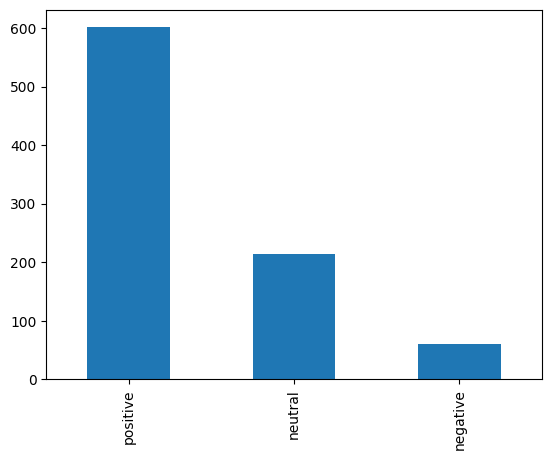

In [ ]:
s = pd.value_counts(df['sentiment'])
ax = s.plot.bar()
n = len(df.index)

In [ ]:
klasifikasi_df = df[df.sentiment != 'neutral']
klasifikasi_df.reset_index(drop=True, inplace=True)

In [ ]:
s_1 = klasifikasi_df[klasifikasi_df['sentiment']=='positive'].sample(1000, replace=True)
s_2 = klasifikasi_df[klasifikasi_df['sentiment']=='negative'].sample(1000, replace=True)
klasifikasi_df = pd.concat([s_1,s_2])

In [ ]:
klasifikasi_df

,Text,Compound,Positive,Negative,Neutral,sentiment
517,happy,0.5719,1.000,0.000,0.000,positive
636,beautiful,0.5994,1.000,0.000,0.000,positive
426,clean and tidy place amazed,0.7096,0.663,0.000,0.337,positive
406,nice photo,0.4215,0.737,0.000,0.263,positive
542,Good,0.4404,1.000,0.000,0.000,positive
...,...,...,...,...,...,...
76,the flow of the waterfall is really fast in th...,-0.0772,0.000,0.106,0.894,negative
603,bagus waterfall with view of sea rekomendasi s...,-0.1531,0.000,0.096,0.904,negative
554,haunted,-0.4767,0.000,1.000,0.000,negative
312,rainy season dirty water,-0.4939,0.000,0.677,0.323,negative


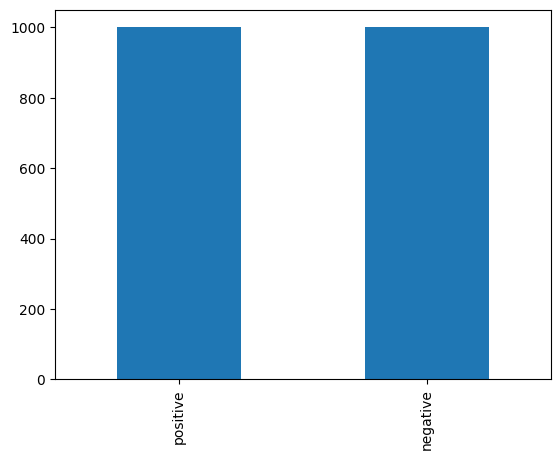

In [ ]:
s = pd.value_counts(klasifikasi_df['sentiment'])
ax = s.plot.bar()
n = len(klasifikasi_df.index)

In [ ]:
# klasifikasi_df.to_csv('https://raw.githubusercontent.com/RBellaApriliaDamayanti22/projectt/main/data_klasifikasi_shopee.csv')
klasifikasi_df.to_csv('/content/drive/My Drive/Kuliah/E-Tourism/data_klasifikasi_review.csv')
klasifikasi_df

,Text,Compound,Positive,Negative,Neutral,sentiment
517,happy,0.5719,1.000,0.000,0.000,positive
636,beautiful,0.5994,1.000,0.000,0.000,positive
426,clean and tidy place amazed,0.7096,0.663,0.000,0.337,positive
406,nice photo,0.4215,0.737,0.000,0.263,positive
542,Good,0.4404,1.000,0.000,0.000,positive
...,...,...,...,...,...,...
76,the flow of the waterfall is really fast in th...,-0.0772,0.000,0.106,0.894,negative
603,bagus waterfall with view of sea rekomendasi s...,-0.1531,0.000,0.096,0.904,negative
554,haunted,-0.4767,0.000,1.000,0.000,negative
312,rainy season dirty water,-0.4939,0.000,0.677,0.323,negative


In [ ]:
def arr(text):
  array_perkata = text.split()
  return array_perkata

In [ ]:
klasifikasi_df['Text'] = klasifikasi_df['Text'].apply(arr)
klasifikasi_df

,Text,Compound,Positive,Negative,Neutral,sentiment
517,[happy],0.5719,1.000,0.000,0.000,positive
636,[beautiful],0.5994,1.000,0.000,0.000,positive
426,"[clean, and, tidy, place, amazed]",0.7096,0.663,0.000,0.337,positive
406,"[nice, photo]",0.4215,0.737,0.000,0.263,positive
542,[Good],0.4404,1.000,0.000,0.000,positive
...,...,...,...,...,...,...
76,"[the, flow, of, the, waterfall, is, really, fa...",-0.0772,0.000,0.106,0.894,negative
603,"[bagus, waterfall, with, view, of, sea, rekome...",-0.1531,0.000,0.096,0.904,negative
554,[haunted],-0.4767,0.000,1.000,0.000,negative
312,"[rainy, season, dirty, water]",-0.4939,0.000,0.677,0.323,negative


### Splitting Data

In [ ]:
from sklearn.model_selection import train_test_split
# Train Test Split Function
X = klasifikasi_df[['Text']]
y = klasifikasi_df['sentiment']
def split_train_test(data_df, test_size=0.2, shuffle_state=True): # 80% Training & 20% Testing. Ubah nilai pada variable test_size jika ingin skala yang lain
    X_train, X_test, Y_train, Y_test = train_test_split(X, 
                                                        y,
                                                        shuffle=shuffle_state,
                                                        test_size=test_size, 
                                                        stratify=y,
                                                        random_state=42)
    print("Value counts for Train sentiments")
    print(Y_train.value_counts())
    print("Value counts for Test sentiments")
    print(Y_test.value_counts())
    print(type(X_train))
    print(type(Y_train))
    X_train = X_train.reset_index()
    X_test = X_test.reset_index()
    Y_train = Y_train.to_frame()
    Y_train = Y_train.reset_index()
    Y_test = Y_test.to_frame()
    Y_test = Y_test.reset_index()
    print(X_train.head())
    return X_train, X_test, Y_train, Y_test

# Call the train_test_split
X_train, X_test, Y_train, Y_test = split_train_test(klasifikasi_df)

Value counts for Train sentiments
positive    800
negative    800
Name: sentiment, dtype: int64
Value counts for Test sentiments
negative    200
positive    200
Name: sentiment, dtype: int64
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.series.Series'>
   index                                               Text
0    372          [good, sometimes, the, water, is, cloudy]
1    537                                             [Good]
2    599  [long, drive, from, bangkal, with, uneven, sur...
3    611  [visit, madura, arrived, here, quite, bagus, p...
4     92                [natural, waterfall, parking, area]


### Word2vec

In [ ]:
from matplotlib import pyplot as plt
import seaborn as sns
import csv
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn import svm
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.metrics import confusion_matrix
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import metrics

In [ ]:
from gensim.models import Word2Vec
import time

# OUTPUT_FOLDER = 'https://github.com/RBellaApriliaDamayanti22/projectt/blob/main/word2vec_1000.model' #Untuk menyimpan file model, sesuaikan dengan drive sendiri. 
OUTPUT_FOLDER = '/content/drive/My Drive/Kuliah/E-Tourism/word2vec_1000.model'
# Skip-gram model (sg = 1)
size = 1000
window = 3
min_count = 1
workers = 3
sg = 1

word2vec_model_file = OUTPUT_FOLDER 
start_time = time.time()
stemmed_tokens = pd.Series(klasifikasi_df['Text']).values
# Train the Word2Vec Model
w2v_model = Word2Vec(stemmed_tokens, min_count = min_count, vector_size = size, workers = workers, window = window, sg = sg)
print("Time taken to train word2vec model: " + str(time.time() - start_time))
w2v_model.save("word2vec_model_file")

Time taken to train word2vec model: 1.1340067386627197


In [ ]:
import pickle
pickle.dump(w2v_model, open("word2vec.pickle", "wb"))

In [ ]:
import numpy as np
# Load the model from the model file
sg_w2v_model = Word2Vec.load('word2vec_model_file')
# # Unique ID of the word
# print("Index of the word 'bagus':")
# # print(sg_w2v_model.wv.vocab["bagus"].index)
# # Total number of the words 
# print(len(sg_w2v_model.wv.vocab))
# # Print the size of the word2vec vector for one word
# print("Length of the vector generated for a word")
# print(len(sg_w2v_model['bagus']))
# # Get the mean for the vectors for an example review
# print("Print Vector Kata di index ke-0:")
# print(np.mean([sg_w2v_model[token] for token in df['stemming'][2]], axis=0))

'''
print("\n Print Semua Kata")
for i in range (len(df['stemming'])):
  print(np.max([sg_w2v_model[token] for token in df['stemming'][i]], axis=0))'''

'\nprint("\n Print Semua Kata")\nfor i in range (len(df[\'stemming\'])):\n  print(np.max([sg_w2v_model[token] for token in df[\'stemming\'][i]], axis=0))'

In [ ]:
#Vector Setiap Kata
stem = []
for i in range (len(X_train['Text'])):
  for y in range(len(X_train['Text'][i])):
    stem.append(X_train['Text'][i][y])

In [ ]:
#Vector Setiap Kata 
v = []
for i in stem:
  vector_w2v = np.mean(sg_w2v_model.wv.get_vector(i))
  v.append(vector_w2v)
print(v)

[0.00046864522, 0.00032260068, 0.00075020926, 0.0005014056, 0.0005538076, 0.00011146037, -3.9174593e-06, 0.00037643866, 0.0004516089, 0.00025266636, 0.000401671, 0.00032657039, 0.00034781592, 0.00035306293, 0.00030828614, 0.00028814233, 0.0005014056, 0.00032221008, 0.0003123464, 0.000361, 0.00036399948, 0.0004460318, 0.00048654078, 0.0005761426, 0.00055749714, 0.0005213924, 0.0004748938, 0.00036399948, 0.0004506148, 0.00037212978, 0.0004104117, 0.00036257642, 0.00032221008, 0.00033358933, 0.00025393182, 0.0003934325, 0.00037466167, 0.00037466167, 0.00048936106, 0.00037254757, 0.00034228552, 0.0003355311, 0.00035449344, 0.00025393182, 0.00039468455, 0.00031667732, 0.00030407662, 0.00013891024, 0.00024080956, 0.00040367842, 0.00034202327, 0.0003755989, 0.0004506148, 0.00041034305, 0.00044350149, 0.00053685106, 0.000602107, 0.0004575182, 0.00023208946, 0.0003434407, 0.0003721909, 0.00036043042, 0.00025676313, 0.00043920206, 0.00040552343, 0.00025393182, -1.5152825e-05, 0.00043920206, 0.00

In [ ]:
vector_w2v = pd.DataFrame(list(zip(stem, v)), columns =['kata', 'vector'])

vector_w2v

,kata,vector
0,good,0.000469
1,sometimes,0.000323
2,the,0.000750
3,water,0.000501
4,is,0.000554
...,...,...
14391,solid,-0.000003
14392,exciting,0.000274
14393,toro,0.000555
14394,waterfall,0.000537


In [ ]:
# import gensim.downloader as api
# word2vec_model = api.load('word2vec-google-news-300')
# import pickle

# file = open('word2vec-model.pkl', 'wb')
# pickle.dump(word2vec_model, file)
# file.close()

In [ ]:
# vector_w2v.to_csv('https://raw.githubusercontent.com/RBellaApriliaDamayanti22/projectt/main/w2v_files.csv')
vector_w2v.to_csv('/content/drive/My Drive/Kuliah/E-Tourism/w2v_files.csv')

In [ ]:
word2vec_filename = OUTPUT_FOLDER 
vector_w2v_file = vector_w2v.to_csv(word2vec_filename, index = False)

with open(word2vec_filename, 'w+') as word2vec_file:
    for index, row in X_train.iterrows():
        model_vector = (np.mean([sg_w2v_model.wv.get_vector(token) for token in row['Text']], axis=0)).tolist()
        if index == 0:
            header = ",".join(str(ele) for ele in range(1000))
            word2vec_file.write(header)
            word2vec_file.write("\n")
        # Check if the line exists else it is vector of zeros
        if type(model_vector) is list:  
            line1 = ",".join( [str(vector_element) for vector_element in model_vector] )
        else:
            line1 = ",".join([str(0) for i in range(1000)])
        word2vec_file.write(line1)
        word2vec_file.write('\n')

In [ ]:
word2vec_filename

'/content/drive/My Drive/Kuliah/E-Tourism/word2vec_1000.model'

### Modelling naive bayes

In [ ]:
word2vec_df = pd.read_csv(word2vec_filename)
word2vec_df

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,0.055413,0.029387,0.032106,0.036329,0.002876,0.004428,0.012075,0.037436,-0.007762,-0.001189,...,0.021741,-0.011832,0.050544,0.021593,0.051823,0.016569,-0.034236,-0.031358,-0.010659,-0.000374
1,-0.000939,0.000499,0.000200,0.000449,-0.000869,0.000465,-0.000158,0.000167,-0.000571,0.000756,...,-0.000189,-0.000935,-0.000911,-0.000603,0.000708,-0.000337,-0.000608,-0.000501,0.000416,0.000564
2,0.068301,0.035031,0.041352,0.049221,0.004137,0.009142,0.009503,0.037363,-0.015190,-0.007762,...,0.029754,-0.019467,0.069055,0.031932,0.070888,0.023177,-0.040439,-0.044689,-0.017850,-0.000709
3,0.071924,0.037237,0.041354,0.054856,0.005608,0.010485,0.011287,0.038990,-0.017793,-0.011380,...,0.032221,-0.018114,0.071030,0.037177,0.077529,0.025387,-0.044007,-0.049133,-0.020224,-0.002851
4,0.071096,0.034634,0.040377,0.048632,0.005793,0.009682,0.009403,0.040321,-0.013575,-0.010159,...,0.029506,-0.017273,0.066107,0.030572,0.069344,0.023020,-0.044128,-0.042728,-0.014559,0.001332
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1595,0.033259,0.016770,0.019532,0.023670,0.002393,0.004410,0.005154,0.018786,-0.006581,-0.004368,...,0.015453,-0.008586,0.031506,0.014242,0.033189,0.011171,-0.020020,-0.020806,-0.008784,0.000457
1596,0.078329,0.034734,0.044175,0.051555,0.008476,0.013756,0.010934,0.038817,-0.013916,-0.009744,...,0.031271,-0.014752,0.068376,0.031910,0.073332,0.024633,-0.047476,-0.045591,-0.013878,0.004415
1597,-0.000282,-0.000225,0.000626,-0.000153,-0.000631,0.000198,-0.000032,0.000497,-0.000927,-0.000019,...,0.000924,-0.000903,0.000842,-0.000641,-0.000605,-0.000304,-0.000060,-0.000908,-0.000614,-0.000967
1598,0.059583,0.029549,0.034324,0.040068,0.000879,0.005814,0.008677,0.038588,-0.009674,-0.006998,...,0.022238,-0.014535,0.055201,0.026241,0.057806,0.018877,-0.038264,-0.033647,-0.014385,0.000192


In [ ]:
word2vec_df.shape

(1600, 1000)

In [ ]:
import time
from sklearn.naive_bayes import GaussianNB
from textblob.classifiers import NaiveBayesClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
# Load from the filename
word2vec_df = pd.read_csv(word2vec_filename)
#Initialize the model https://medium.com/analytics-vidhya/what-is-a-confusion-matrix-d1c0f8feda5
# clf_decision_word2vec = SVC(C=0.1, gamma=0.1, kernel="rbf")
# clf_decision_word2vec = SVC()
gnb = GaussianNB(priors=None, var_smoothing=1e-9)

start_time = time.time()
# Fit the model
gnb.fit(word2vec_df, Y_train['sentiment'])
print("Time taken to fit the model with word2vec vectors: " + str(time.time() - start_time))

Time taken to fit the model with word2vec vectors: 0.05881357192993164


In [ ]:
import pickle
pickle.dump(gnb, open("model.pickle", "wb"))

### Evaluasi

In [ ]:
X_test

,index,Text
0,501,"[annoying, trash]"
1,641,"[place, to, suck]"
2,260,"[splash, sea, waterfall, falls, cool, water]"
3,255,"[nice, by, the, highway, unfortunately, dirty,..."
4,420,"[dirty, clean, place]"
...,...,...
395,136,"[suitable, tours, like, refreshing, photos]"
396,295,"[photo, spots, to, get, bored]"
397,554,[haunted]
398,501,"[annoying, trash]"


In [ ]:
from sklearn.metrics import classification_report
test_features_word2vec = []
for index, row in X_test.iterrows():
    model_vector = np.mean([sg_w2v_model.wv.get_vector(token) for token in row['Text']], axis=0)
    if model_vector.dtype == 'float32':
        test_features_word2vec.append(model_vector)
    else:
        test_features_word2vec.append(np.array([0 for i in range(1000)]))
test_predictions_word2vec = gnb.predict(test_features_word2vec)
print(classification_report(Y_test['sentiment'],test_predictions_word2vec))

              precision    recall  f1-score   support

    negative       0.53      0.84      0.65       200
    positive       0.62      0.25      0.36       200

    accuracy                           0.55       400
   macro avg       0.57      0.55      0.50       400
weighted avg       0.57      0.55      0.50       400



/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(


In [ ]:
test_features_word2vec

[array([ 7.12591931e-02,  3.39651220e-02,  5.90757169e-02,  5.15762903e-02,
        -4.64041606e-02, -1.05983112e-02,  2.88728084e-02,  7.63158649e-02,
        -3.60927135e-02, -2.00409722e-02,  2.58640312e-02,  3.47865038e-02,
        -1.86768211e-02,  2.25817133e-02,  8.00957680e-02, -3.10278460e-02,
        -1.16274040e-02, -2.40981625e-03,  3.02135100e-04, -7.41963685e-02,
         5.50714210e-02, -4.24169153e-02,  9.74960253e-03, -1.50954025e-02,
         3.65921408e-02, -2.26931944e-02,  3.90734188e-02, -5.89689426e-03,
        -1.38525516e-01,  2.42566131e-02,  5.96779287e-02, -2.52486896e-02,
        -9.23611317e-03, -4.36261520e-02,  4.06116955e-02, -4.07769112e-04,
         5.15061505e-02, -4.67011798e-03, -2.85624005e-02, -6.39789179e-02,
        -6.72542602e-02,  3.20288800e-02, -1.16436988e-01,  6.19938523e-02,
        -5.56317903e-03, -8.21656138e-02, -2.13584099e-02,  4.90539372e-02,
        -4.29920368e-02,  7.03054294e-02, -6.08433830e-03, -2.85950135e-02,
        -3.1

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(


Text(0.5, 1.0, 'Confusion Matrix Naive Bayes')

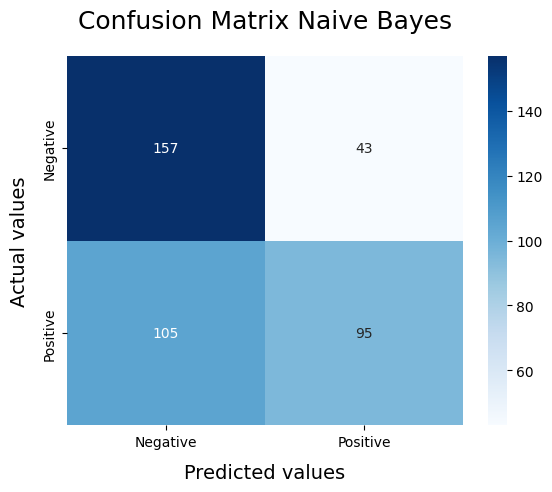

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

#Prediciting the test results
y_predict_test = gnb.predict(test_features_word2vec)
cm = confusion_matrix(Y_test['sentiment'], y_predict_test)
categories = ['Negative','Positive']

sns.heatmap(cm, annot=True, fmt='', cmap='Blues', xticklabels = categories, yticklabels = categories)
plt.xlabel("Predicted values", fontdict = {'size':14}, labelpad = 10)
plt.ylabel("Actual values" , fontdict = {'size':14}, labelpad = 10)
plt.title ("Confusion Matrix Naive Bayes", fontdict = {'size':18}, pad = 20)

In [ ]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

# Preprocess the data and split into train and test sets

# Create feature vectors
train_vectors = word2vec_df # Generate feature vectors for training data
test_vectors = test_features_word2vec # Generate feature vectors for test data

# Define the Naive Bayes classifier
clf = GaussianNB()

# Define the parameter grid for tuning
param_grid = {
    'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6, 1e-5]
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(clf, param_grid, cv=5, scoring='accuracy')
grid_search.fit(train_vectors, Y_train['sentiment'])

# Print the best parameter combination found
print("Best parameters:", grid_search.best_params_)

# Evaluate the model with the best parameters
best_clf = grid_search.best_estimator_
predictions = best_clf.predict(test_vectors)

# Print classification report
print("Classification Report:")
print(classification_report(Y_test['sentiment'], predictions))

In [ ]:
nb_classifier = GaussianNB()

params_NB = {'var_smoothing': np.logspace(0,-9, num=100)}
gs_NB = GridSearchCV(estimator=nb_classifier, 
                 param_grid=params_NB, 
                 cv=5,   # use any cross validation technique 
                 verbose=1, 
                 scoring='accuracy') 
gs_NB.fit(word2vec_df, Y_train['sentiment'])

gs_NB.best_params_

Fitting 5 folds for each of 100 candidates, totalling 500 fits


{'var_smoothing': 8.111308307896872e-05}

## optimalisasi model

In [ ]:
Y_train.shape

(1600,)

In [ ]:
ubahnilainegatif = np.where(word2vec_df<0, 0, word2vec_df)
ubahnilainegatif

array([[4.45057154e-02, 5.57524571e-03, 3.18819620e-02, ...,
        0.00000000e+00, 0.00000000e+00, 5.56896732e-04],
       [5.13474941e-02, 7.45135173e-03, 3.62998135e-02, ...,
        0.00000000e+00, 0.00000000e+00, 3.89499692e-05],
       [4.72977292e-04, 0.00000000e+00, 0.00000000e+00, ...,
        4.40509320e-05, 0.00000000e+00, 7.21792807e-04],
       ...,
       [5.84172010e-02, 7.92703591e-03, 4.07014899e-02, ...,
        0.00000000e+00, 0.00000000e+00, 1.34022953e-03],
       [4.80848588e-02, 6.53414195e-03, 3.37117836e-02, ...,
        0.00000000e+00, 0.00000000e+00, 1.34428265e-03],
       [5.36141433e-02, 7.71587668e-03, 3.89061272e-02, ...,
        0.00000000e+00, 0.00000000e+00, 8.75225174e-04]])

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

# Preprocess the data and split into train and test sets

# Create feature vectors
vectorizer = CountVectorizer()
train_vectors = vectorizer.fit_transform(word2vec_df)
test_vectors = vectorizer.transform(Y_test['sentiment'])

# Define the Naive Bayes classifier
clf = MultinomialNB()

# Define the parameter grid for tuning
param_grid = {
    'alpha': [0.1, 0.5, 1.0, 5.0, 10.0],
    'fit_prior': [True, False]
}

# Perform grid search with cross-validation
grid_search = GridSearchCV(clf, param_grid, cv=5, scoring='accuracy')
grid_search.fit(ubahnilainegatif, Y_train)

# # Print the best parameter combination found
print("Best parameters:", grid_search.best_params_)

# # Evaluate the model with the best parameters
best_clf = grid_search.best_estimator_
predictions = best_clf.predict(test_features_word2vec)

# # Print classification report
print("Classification Report:")
print(classification_report(Y_test['sentiment'], predictions))

Best parameters: {'alpha': 0.1, 'fit_prior': True}
Classification Report:
              precision    recall  f1-score   support

    negative       0.52      1.00      0.69       200
    positive       1.00      0.09      0.17       200

    accuracy                           0.55       400
   macro avg       0.76      0.55      0.43       400
weighted avg       0.76      0.55      0.43       400



In [ ]:
text = ""